[VideoMAEv2](https://github.com/OpenGVLab/VideoMAEv2/tree/master)

[dataset](https://github.com/OpenGVLab/VideoMAEv2/blob/master/dataset/datasets.py)

In [1]:
%matplotlib inline

import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE" # tells OpenMP to not complain if it notices that two copies of OpenMP are loaded.

from IPython.display import Video
from IPython.display import Audio as play_audio
from torchvision.utils import make_grid
from torchcodec.encoders import VideoEncoder

def play_video(encoded_bytes):
    return Video(data=encoded_bytes.numpy().tobytes(),
                embed=True, width=640, height=360, mimetype="video/mp4")

import matplotlib.pyplot as plt

import sys
sys.path.append('../../../../')

In [2]:
from pathlib import Path
import math
import time
import random
import numbers
import datetime
from functools import partial

import cv2 
import torch
from torch.nn.modules.utils import _pair

from torchvision import transforms

import numpy as np
from PIL import Image

%load_ext autoreload
%autoreload 2

from computer_vision.video_mae.finetune_parameter_parser import parser
from computer_vision.video_mae.dataset.datasets import VideoClsDataset
from computer_vision.video_mae.dataset.video_transforms import _pil_interp

In [3]:
data_dirpath=Path('D:/data/UCF101')
root=data_dirpath/'UCF-101'
train_annotation_path=data_dirpath/'UCF101TrainTestSplits-RecognitionTask/trainlist01.txt'
val_annotation_path=data_dirpath/'UCF101TrainTestSplits-RecognitionTask/vallist01.txt'

mini_train=False
if not mini_train:
    pretrain_path=Path('D:/results/ucf101/video_mae/train/checkpoints/last.pth') 
    output_dirpath=Path('D:/results/ucf101/video_mae/finetune') 
    arguments= f"""--data_root {root} --train_data_path {train_annotation_path} --val_data_path {val_annotation_path} 
    --output_dir {output_dirpath} --finetune {pretrain_path} 
    --data_set UCF101 --nb_classes 101  --batch_size 3 --input_size 224
    --short_side_size 224 --num_frames 16 --sampling_rate 4 --num_sample 2 --num_workers 0 --opt adamw
    --lr 1e-3 --drop_path 0.3 --clip_grad 5.0 --layer_decay 0.9 --opt_betas 0.9 0.999 --weight_decay 0.1
    --test_num_segment 5 --test_num_crop 3 --dist_eval
    --warmup_epochs 5 --epochs 35  --print_freq 20 --device cpu --time 12 --resume
    """ # --use-cutmix-mixup
else:
    pretrain_path=Path('D:/results/ucf101/video_mae/mini_train/checkpoints/last.pth') 
    output_dirpath=Path('D:/results/ucf101/video_mae/mini_finetune') 
    arguments= f"""--data_root {root} --train_data_path {train_annotation_path} --val_data_path {val_annotation_path} 
    --output_dir {output_dirpath}  --finetune {pretrain_path} 
    --data_set UCF101 --nb_classes 101  --batch_size 3 --input_size 224
    --short_side_size 224 --num_frames 16 --sampling_rate 4 --num_sample 2 --num_workers 0 --opt adamw
    --lr 1e-3 --drop_path 0.3 --clip_grad 5.0 --layer_decay 0.9 --opt_betas 0.9 0.999 --weight_decay 0.1
    --test_num_segment 5 --test_num_crop 3 --dist_eval 
    --warmup_epochs 5 --print_freq 20 --epochs 35  --device cpu --resume
    --n_steps 12 --n_epochs 2 --time 0.5
    """ # --use-cutmix-mixup --time 18 --resume

known_args, _=parser.parse_known_args(args=arguments.split())
if known_args.enable_deepspeed:
    parser=deepspeed.add_config_arguments(parser)
    ds_init=deepspeed.initialize
else: ds_init=None
args=parser.parse_args(arguments.split())


In [4]:
# dataset_train=VideoClsDataset(data_root=args.data_root, anno_path=args.train_data_path, mode='train', clip_len=args.num_frames, 
#                         frame_sample_rate=args.sampling_rate, num_segment=1, test_num_segment=args.test_num_segment,
#                         test_num_crop=args.test_num_crop, num_crop=1, keep_aspect_ratio=True, crop_size=args.input_size,
#                         short_side_size=args.short_side_size, new_height=256, new_width=320, args=args)
args.nb_classes=101

dataset_val=VideoClsDataset(data_root=args.data_root, anno_path=args.val_data_path, mode='validation', clip_len=args.num_frames, 
                        frame_sample_rate=args.sampling_rate, num_segment=1, test_num_segment=args.test_num_segment,
                        test_num_crop=args.test_num_crop, num_crop=1, keep_aspect_ratio=True, crop_size=args.input_size,
                        short_side_size=args.short_side_size, new_height=256, new_width=320, args=args)

# dataset_test=VideoClsDataset(data_root=args.data_root, anno_path=args.val_data_path, mode='test', clip_len=args.num_frames, 
#                         frame_sample_rate=args.sampling_rate, num_segment=1, test_num_segment=args.test_num_segment,
#                         test_num_crop=args.test_num_crop, num_crop=3, keep_aspect_ratio=True, crop_size=args.input_size,
#                         short_side_size=args.short_side_size, new_height=256, new_width=320, args=args)

type(frames)=<class 'torch.Tensor'>, frames.shape=torch.Size([3, 16, 224, 224]), frames.dtype=torch.float32, (-2.1,2.6)


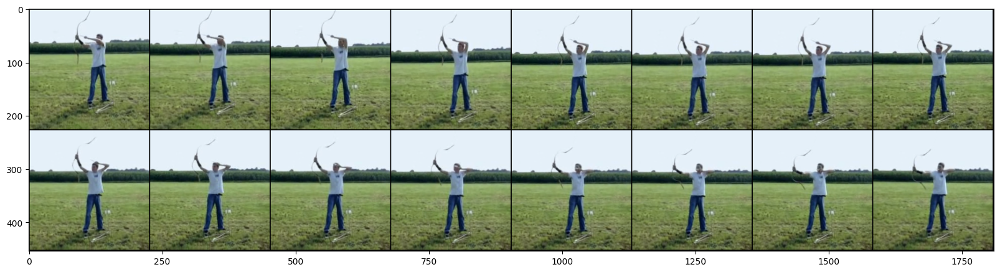

In [5]:
index=90
# def __getitem__(self, index):
if dataset_val.mode=='train': frames_list, label_list, index_list, some_set=dataset_train._get_train_item(index=index, args=dataset_train.args, 
                                                                                                            scale_t=1)
elif dataset_val.mode=='validation': frames, label, fname=dataset_val._get_val_item(index=index)


print(f"{type(frames)=}, {frames.shape=}, {frames.dtype=}, ({frames.min().item():.1f},{frames.max().item():.1f})")
plt.figure(figsize=(20,20))
plt.imshow(make_grid(frames.transpose(0,1), normalize=True).permute(1,2,0))

In [6]:
sample=dataset_val.dataset_samples[index]
buffer=dataset_val.load_video(sample)
if len(buffer)==0:
    while len(buffer)==0:
        warnings.warn(f"video {sample} not correctly loaded during validation")
        index=np.random.randint(dataset_val.__len__())
        sample=dataset_val.dataset_samples[index]
        buffer=dataset_val.load_video(sample)
print(f"{type(buffer)=}, {buffer.shape=}, {buffer.dtype=}, ({buffer.min().item():.1f},{buffer.max().item():.1f})")
buffer=dataset_val.data_transform(buffer)
print(f"{type(buffer)=}, {buffer.shape=}, {buffer.dtype=}, ({buffer.min().item():.1f},{buffer.max().item():.1f})")
return buffer, dataset_val.label_array[index], os.path.splitext(os.path.basename(sample))[0]

type(buffer)=<class 'numpy.ndarray'>, buffer.shape=(16, 240, 320, 3), buffer.dtype=dtype('uint8'), (0.0,255.0)
type(buffer)=<class 'torch.Tensor'>, buffer.shape=torch.Size([3, 16, 224, 224]), buffer.dtype=torch.float32, (-2.1,2.6)


In [11]:
os.path.splitext(os.path.basename(sample))[0]

'v_Archery_g03_c01'

In [9]:
dataset_val.label_array[index], os.path.splitext(os.path.basename(sample))[0]

(3,
 'D:\\data\\UCF101\\UCF-101\\Archery/v_Archery_g03_c01.avi',
 'v_Archery_g03_c01')

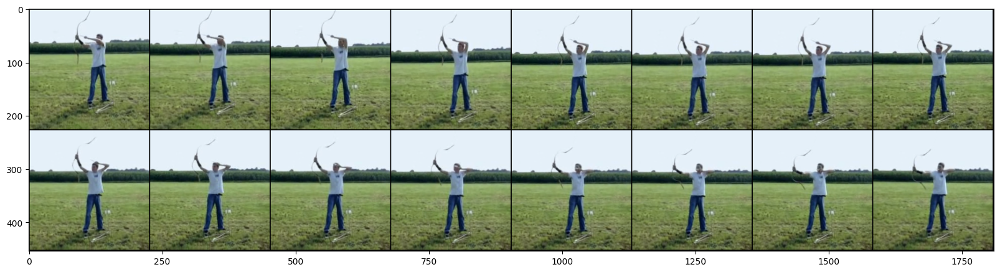

In [8]:

plt.figure(figsize=(20,20))
plt.imshow(make_grid(buffer.transpose(0,1), normalize=True).permute(1,2,0))

In [7]:
from computer_vision.video_mae.dataset.video_transforms import Compose, Resize, CenterCrop, ClipToTensor, Normalize
from computer_vision.video_mae.dataset.functional import resize_clip
from computer_vision.video_mae.dataset.pretrained_datasets import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD

In [8]:
data_transform=Compose([Resize(dataset_val.short_side_size, interpolation='bilinear'),
                        CenterCrop(size=(dataset_val.crop_size, dataset_val.crop_size)),
                        ClipToTensor(),
                        Normalize(mean=IMAGENET_DEFAULT_MEAN, std=IMAGENET_DEFAULT_STD)])

<class 'numpy.ndarray'>, uint8, (16, 240, 320, 3) (0.0,255.0)
<class 'torch.Tensor'>, torch.float32, torch.Size([3, 16, 224, 224]) (-2.1,2.6)


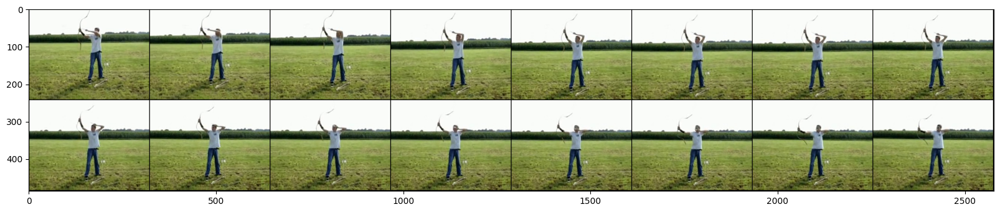

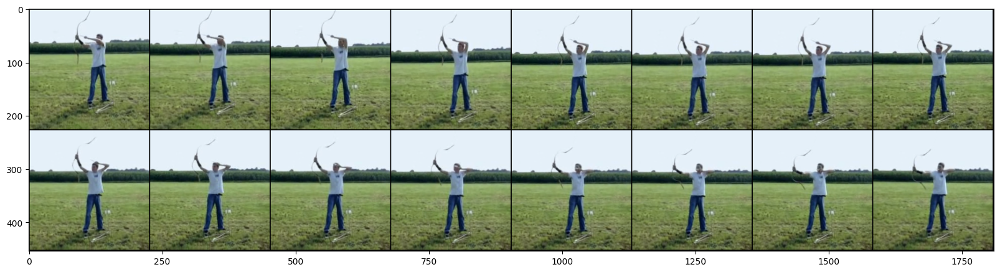

In [9]:
clip=buffer.copy()
outs=data_transform(clip)
print(f'{type(clip)}, {clip.dtype}, {clip.shape} ({clip.min().item():.1f},{clip.max().item():.1f})')   
print(f'{type(outs)}, {outs.dtype}, {outs.shape} ({outs.min().item():.1f},{outs.max().item():.1f})')   
plt.figure(figsize=(20,20)) 
plt.imshow(make_grid(torch.from_numpy(clip).permute(0,3,1,2).contiguous()).permute(1,2,0)) # from (T,H,W,C) to (T,C,H,W)
plt.figure(figsize=(20,20))
plt.imshow(make_grid(outs.transpose(0,1), normalize=True).permute(1,2,0))

<class 'torch.Tensor'>, torch.float32, torch.Size([3, 16, 240, 320]) (-2.1,2.6)


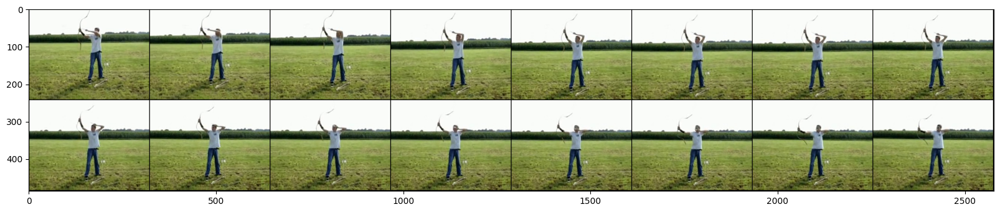

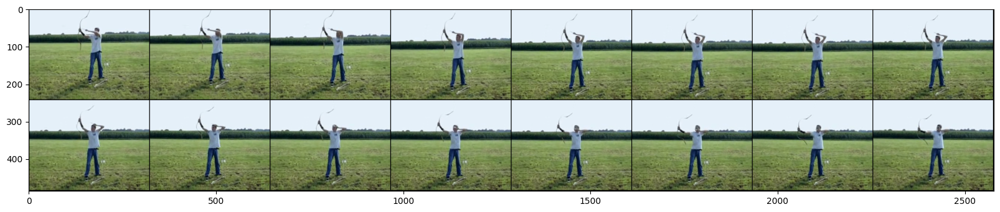

In [8]:
clip=buffer.copy()
transform=ClipToTensor()
clip=transform(clip)

transform=Normalize(mean=IMAGENET_DEFAULT_MEAN, std=IMAGENET_DEFAULT_STD)
outs=transform(clip)
print(f'{type(outs)}, {outs.dtype}, {outs.shape} ({outs.min().item():.1f},{outs.max().item():.1f})')   
plt.figure(figsize=(20,20)) 
plt.imshow(make_grid(torch.from_numpy(buffer).permute(0,3,1,2).contiguous()).permute(1,2,0)) # from (T,H,W,C) to (T,C,H,W)
plt.figure(figsize=(20,20))
plt.imshow(make_grid(outs.transpose(0,1), normalize=True).permute(1,2,0))

(torch.Size([3, 16, 240, 320]), (1, 1, 1))

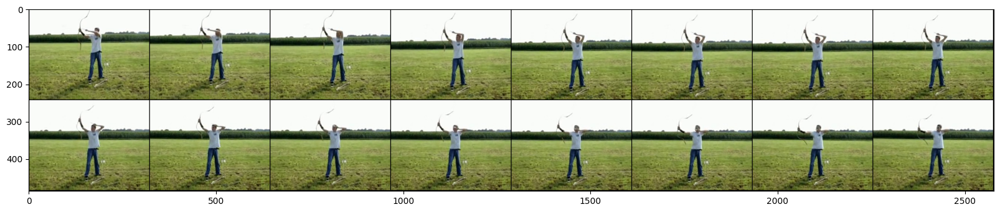

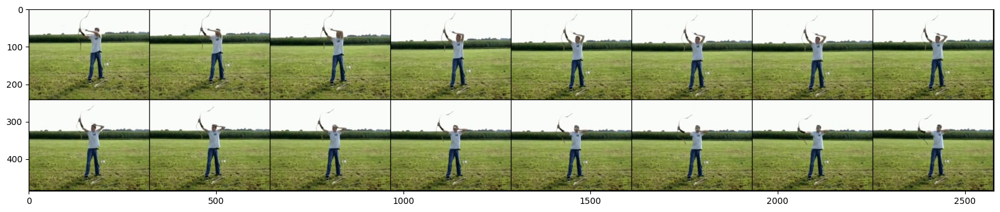

In [13]:
clip=buffer.copy()
transform=ClipToTensor()
outs=transform(clip)
print(f'{type(outs)}, {outs.dtype}, {outs.shape} ({outs.min().item():.1f},{outs.max().item():.1f})')   
plt.figure(figsize=(20,20)) 
plt.imshow(make_grid(torch.from_numpy(buffer).permute(0,3,1,2).contiguous()).permute(1,2,0)) # from (T,H,W,C) to (T,C,H,W)
plt.figure(figsize=(20,20))
plt.imshow(make_grid(outs.transpose(0,1), normalize=True).permute(1,2,0))

np.stack(cropped).shape=(16, 224, 224, 3), buffer.shape=(16, 240, 320, 3)


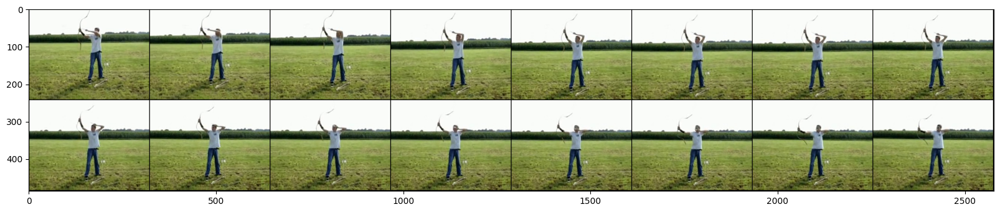

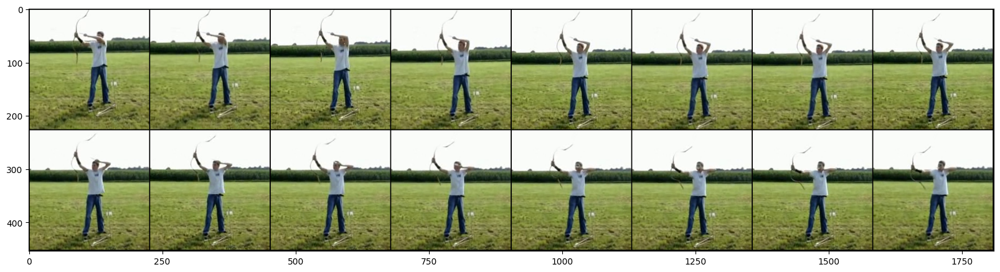

In [15]:
transform=CenterCrop(size=(dataset_val.crop_size, dataset_val.crop_size))
cropped=transform(buffer)

print(f"{np.stack(cropped).shape=}, {buffer.shape=}")
plt.figure(figsize=(20,20)) 
plt.imshow(make_grid(torch.from_numpy(buffer).permute(0,3,1,2).contiguous()).permute(1,2,0)) # from (T,H,W,C) to (T,C,H,W)
plt.figure(figsize=(20,20))
plt.imshow(make_grid(torch.from_numpy(np.stack(cropped)).permute(0,3,1,2).contiguous()).permute(1,2,0))

In [14]:
clip=buffer.copy()



In [ ]:
min_h, min_w=y1,x1


np.stack(resized).shape=(16, 224, 298, 3), buffer.shape=(16, 240, 320, 3)


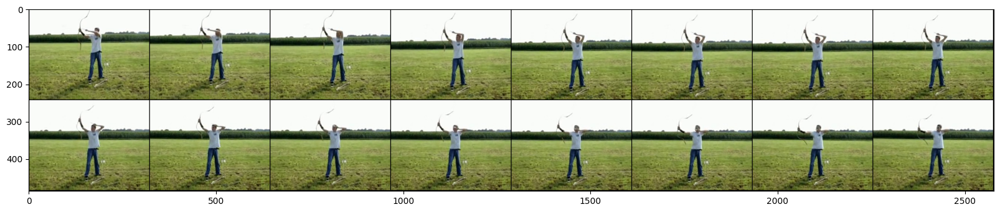

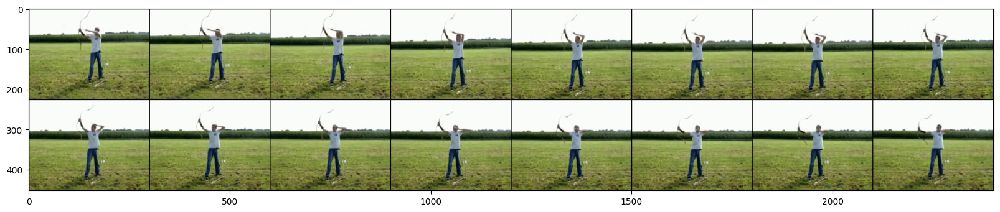

In [10]:
print(f"{np.stack(resized).shape=}, {buffer.shape=}")
plt.figure(figsize=(20,20)) 
plt.imshow(make_grid(torch.from_numpy(buffer).permute(0,3,1,2).contiguous()).permute(1,2,0)) # from (T,H,W,C) to (T,C,H,W)
plt.figure(figsize=(20,20))
plt.imshow(make_grid(torch.from_numpy(np.stack(resized)).permute(0,3,1,2).contiguous()).permute(1,2,0))

torch.Size([3, 486, 2578])